<a href="https://colab.research.google.com/github/ifeanyiojji/Dog-vs-Cat-Classification/blob/main/Dog_vs_Cat_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install kaggle

In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Importing the dog vs cat dataset from kaggle

In [4]:
# using the kaggle api
!kaggle competitions download -c dogs-vs-cats

 99% 801M/812M [00:09<00:00, 150MB/s]
100% 812M/812M [00:09<00:00, 92.7MB/s]


In [19]:
# extracting the compressed dataset

from zipfile import ZipFile

data = '/content/sample_data/dogs-vs-cats.zip'

with ZipFile(data, 'r') as zip:
  zip.extractall()
  print('The dataset is extracted')


The dataset is extracted


In [22]:
# extracting the compressed dataset
from zipfile import ZipFile

dataset = '/content/train.zip'

with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [23]:
import os
# counting the number of files in train folder
path, dirs, files = next(os.walk('/content/train'))
file_count = len(files)
print('Number of images: ', file_count)

Number of images:  25000


Print the name of images

In [24]:
file_names = os.listdir('/content/train')
print(file_names)

['dog.10806.jpg', 'cat.9073.jpg', 'cat.5276.jpg', 'dog.12235.jpg', 'cat.851.jpg', 'dog.2447.jpg', 'cat.9483.jpg', 'cat.1307.jpg', 'cat.5064.jpg', 'dog.11406.jpg', 'dog.6992.jpg', 'cat.7292.jpg', 'dog.1593.jpg', 'cat.2415.jpg', 'dog.6796.jpg', 'dog.11319.jpg', 'cat.8104.jpg', 'dog.6334.jpg', 'dog.10318.jpg', 'cat.30.jpg', 'dog.3818.jpg', 'dog.1653.jpg', 'dog.9425.jpg', 'dog.1269.jpg', 'dog.5508.jpg', 'cat.11285.jpg', 'dog.7963.jpg', 'cat.5021.jpg', 'cat.12246.jpg', 'cat.4012.jpg', 'dog.2751.jpg', 'dog.7772.jpg', 'cat.10796.jpg', 'cat.5655.jpg', 'cat.5701.jpg', 'cat.800.jpg', 'dog.1356.jpg', 'dog.10632.jpg', 'cat.2678.jpg', 'cat.1857.jpg', 'dog.6069.jpg', 'dog.1294.jpg', 'dog.6474.jpg', 'cat.1173.jpg', 'dog.604.jpg', 'cat.10400.jpg', 'cat.12183.jpg', 'dog.805.jpg', 'dog.4271.jpg', 'cat.6127.jpg', 'cat.4013.jpg', 'cat.9300.jpg', 'dog.102.jpg', 'cat.8726.jpg', 'cat.10783.jpg', 'cat.10816.jpg', 'cat.3838.jpg', 'cat.6863.jpg', 'dog.4323.jpg', 'cat.9142.jpg', 'dog.11324.jpg', 'dog.10875.jpg',

Importing the Dependecies

In [25]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mping
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

Displaying the images of dogs and cats

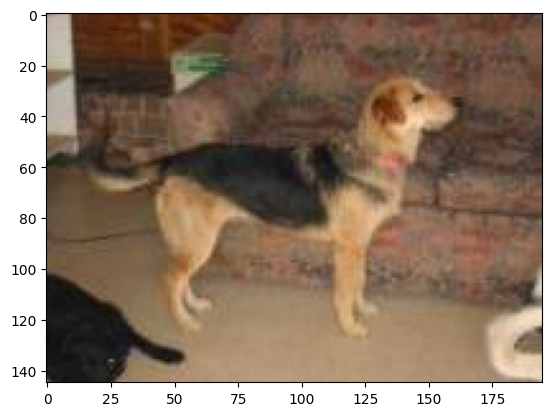

In [28]:
#dog image

img = mping.imread('/content/train/dog.12235.jpg')
imgplot = plt.imshow(img)
plt.show()

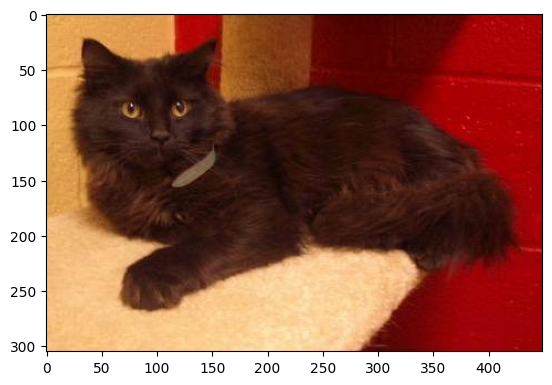

In [29]:
#cat image

img = mping.imread('/content/train/cat.5276.jpg')
imgplot = plt.imshow(img)
plt.show()

In [31]:
file_names = os.listdir('/content/train')

for i in range(5):

  name = file_names[i]
  print(name[0:3])


dog
cat
cat
dog
cat


In [32]:
file_names = os.listdir('/content/train')

dog_count = 0
cat_count = 0


for img_file in file_names:

  name = img_file[0:3]

  if name == 'dog':
    dog_count += 1

  else:
    cat_count += 1


print('Number of dog images: ', dog_count)
print('Number of dog images: ', cat_count)


Number of dog images:  12500
Number of dog images:  12500


Resize the images

In [33]:
#create a directory for all the resized images

os.mkdir('/content/image resized')

In [36]:
original_folder = '/content/train/'
resized_folder = '/content/image resized/'

for i in range(2000):

  filename = os.listdir(original_folder)[i]
  img_path = original_folder+filename


  img = Image.open(img_path)
  img = img.resize((224,224))
  img = img.convert('RGB')


  newImgPath = resized_folder + filename
  img.save(newImgPath)

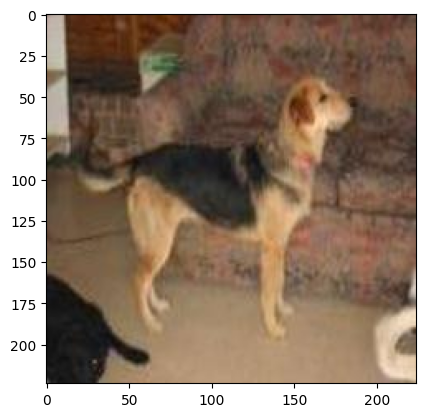

In [37]:
#dog resized image

img = mping.imread('/content/image resized/dog.12235.jpg')
imgplot = plt.imshow(img)
plt.show()

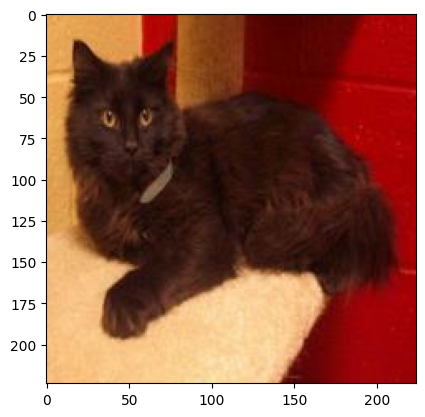

In [38]:
#cat resized image

img = mping.imread('/content/image resized/cat.5276.jpg')
imgplot = plt.imshow(img)
plt.show()

## **Creating label for the resized images of dogs and cats**

Cat --> 0

Dog --> 1

In [39]:
#assigning labels
filenames = os.listdir('/content/image resized')

labels = []


for i in range(2000):

  file_name = filenames[i]
  label = file_name[0:3]


  if label == 'dog':
    labels.append(1)

  else:
    labels.append(0)

In [42]:
print(filenames[0:5])
print(labels[0:5])
print(len(labels))

['dog.10806.jpg', 'cat.9073.jpg', 'cat.5276.jpg', 'dog.12235.jpg', 'cat.851.jpg']
[1, 0, 0, 1, 0]
2000


In [43]:
# counting the images of dogs and cat in the resized 2000 images

values, counts = np.unique(labels, return_counts=True)
print(values)
print(counts)

[0 1]
[1017  983]


Convert images to numpy arrays

In [44]:
import cv2
import glob

In [45]:
image_directory = '/content/image resized/'
image_extension = ['png', 'jpg']

files = []

[files.extend(glob.glob(image_directory + '*.' + e)) for e in image_extension]

dog_cat_images = np.asarray([cv2.imread(file) for file in files])

In [46]:
print(dog_cat_images)

[[[[ 47  59 101]
   [ 47  59 101]
   [ 49  61 103]
   ...
   [105 143 208]
   [ 92 132 197]
   [ 82 122 187]]

  [[ 54  66 108]
   [ 54  66 108]
   [ 55  67 109]
   ...
   [100 140 205]
   [ 91 131 196]
   [ 80 122 187]]

  [[ 55  67 109]
   [ 54  66 108]
   [ 54  65 109]
   ...
   [ 98 141 204]
   [ 94 137 200]
   [ 90 134 197]]

  ...

  [[ 88 107 145]
   [ 88 107 145]
   [ 84 102 143]
   ...
   [104 117 161]
   [102 115 159]
   [101 114 158]]

  [[ 76  95 133]
   [ 73  92 130]
   [ 74  93 131]
   ...
   [100 113 157]
   [100 113 157]
   [100 113 157]]

  [[ 64  83 121]
   [ 60  79 117]
   [ 65  84 122]
   ...
   [100 113 157]
   [101 114 158]
   [102 115 159]]]


 [[[172 104  59]
   [153  85  40]
   [128  55  11]
   ...
   [188 114  56]
   [189 113  60]
   [188 114  60]]

  [[181 110  66]
   [169  99  52]
   [152  79  35]
   ...
   [193 116  59]
   [190 114  61]
   [188 114  60]]

  [[189 117  70]
   [187 115  67]
   [182 107  61]
   ...
   [199 120  63]
   [194 116  63]
   [189 113

In [47]:
type(dog_cat_images)

numpy.ndarray

In [48]:
dog_cat_images.shape

(2000, 224, 224, 3)

In [49]:
x = dog_cat_images
y = np.asarray(labels)

Splitting Train and Test Data

In [50]:
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size=0.2, random_state=2)

In [54]:
#scaling the data

x_train_scaled = x_train/255

x_test_scaled = x_test/255



In [55]:
print(x_train_scaled)

[[[[0.56862745 0.56470588 0.54901961]
   [0.57254902 0.56862745 0.55294118]
   [0.58039216 0.57647059 0.56078431]
   ...
   [0.56862745 0.57647059 0.58039216]
   [0.5254902  0.52156863 0.5372549 ]
   [0.51764706 0.51372549 0.52941176]]

  [[0.56470588 0.56078431 0.54509804]
   [0.56862745 0.56470588 0.54901961]
   [0.57647059 0.57254902 0.55686275]
   ...
   [0.56078431 0.56862745 0.57254902]
   [0.54509804 0.54117647 0.55686275]
   [0.50196078 0.49803922 0.51372549]]

  [[0.55686275 0.55294118 0.5372549 ]
   [0.56078431 0.55686275 0.54117647]
   [0.56862745 0.56470588 0.54901961]
   ...
   [0.54509804 0.55294118 0.55686275]
   [0.56470588 0.56078431 0.57647059]
   [0.47843137 0.4745098  0.49019608]]

  ...

  [[0.45098039 0.54509804 0.54509804]
   [0.42745098 0.51764706 0.5254902 ]
   [0.38431373 0.48235294 0.49803922]
   ...
   [0.5372549  0.54901961 0.54117647]
   [0.54117647 0.55294118 0.54509804]
   [0.54117647 0.55294118 0.54509804]]

  [[0.43137255 0.5254902  0.5254902 ]
   [0.4

Building The Nueral Network

In [56]:
import tensorflow as tf
import tensorflow_hub as hub

In [57]:
mobilenet_model = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4'

pretrained_model = hub.KerasLayer(mobilenet_model, input_shape=(224,224,3), trainable=False)

In [58]:
num_of_classes = 2

model = tf.keras.Sequential([

     pretrained_model,
     tf.keras.layers.Dense(num_of_classes)


])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 2)                 2562      
                                                                 
Total params: 2260546 (8.62 MB)
Trainable params: 2562 (10.01 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [60]:
model.compile(

      optimizer = 'adam',
      loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
      metrics = ['acc']


)

In [61]:
model.fit(x_train_scaled, y_train, epochs=5)

Epoch 1/5
50/50 [==============================] - 72s 1s/step - loss: 0.2710 - acc: 0.8656
Epoch 2/5
50/50 [==============================] - 65s 1s/step - loss: 0.0785 - acc: 0.9719
Epoch 3/5
50/50 [==============================] - 69s 1s/step - loss: 0.0591 - acc: 0.9837
Epoch 4/5
50/50 [==============================] - 66s 1s/step - loss: 0.0475 - acc: 0.9875
Epoch 5/5
50/50 [==============================] - 67s 1s/step - loss: 0.0422 - acc: 0.9894


In [62]:
score, acc = model.evaluate(x_test_scaled, y_test)
print('Test loss = ', score)
print('Test Accuracy = ', acc)

13/13 [==============================] - 19s 1s/step - loss: 0.0826 - acc: 0.9625
Test loss =  0.08256605267524719
Test Accuracy =  0.9624999761581421


Predictive System

Path of the image to be predicted: /content/charlesdeluvio-Mv9hjnEUHR4-unsplash.jpg


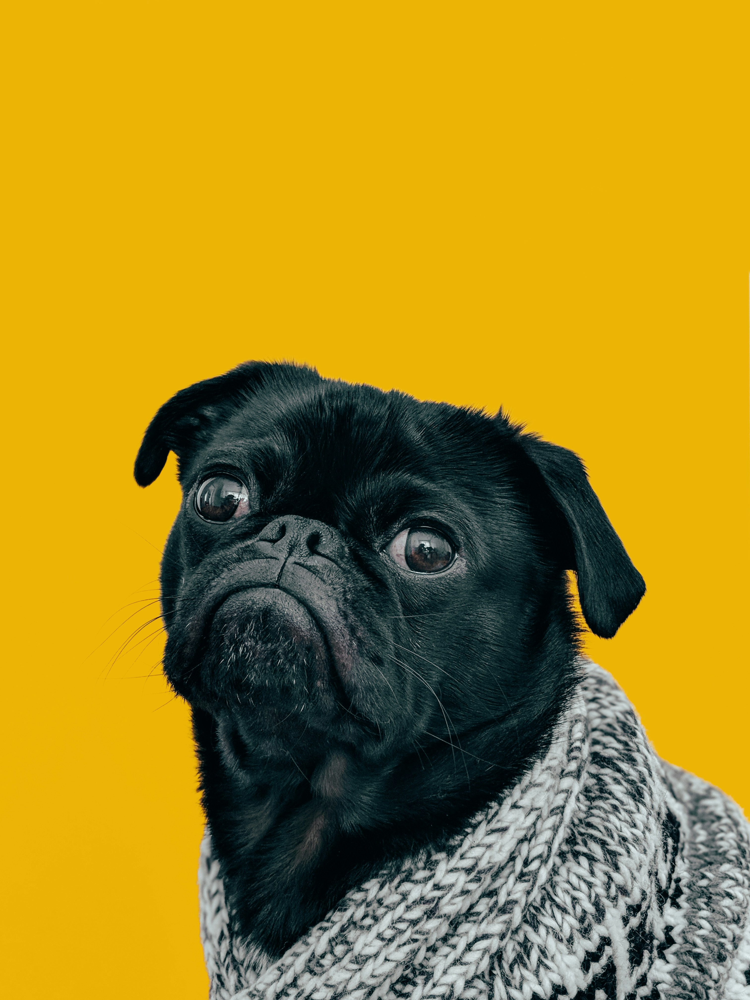

1/1 [==============================] - 0s 84ms/step
[[0.19683471 0.6070914 ]]
1
The image represents a Dog


In [67]:
input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 0:
  print('The image represents a Cat')

else:
  print('The image represents a Dog')